# Dog End to End multi class Dog Breed Classification

This notebook builds an end-to-end multi class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a Dog given an image of a dog.

When i'm sitting at a cafe and I take a photo of it, I want ot know the breed of the dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilites with each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We are dealing with images(Unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes).

* There are around 10,000+ images in the training set
(these images have labels)

* There are around 10,000+ images in the test set
(these images have no labels, because we'll want to predict them)

tidbit: an unstructured data is anything that is not in a dataframe so no rows and coloumn.

tidbit: it is a multi class classification, if there will be only two dogs breed it would have been binary class classification.

# Get our work space ready

* import tensorflow 2.x
* import tensorflow Hub
* Make sure we're using a GPU

In [ ]:
# import necessary tools into colab

import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)
print(hub.__version__)

# check for GPU availability

tf.config.list_physical_devices("GPU")

2.15.0
0.16.1


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Getting our data ready (turning into Tensors)

with all machine learning models, our data to be numerical format. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [ ]:
# checkout the labels of our data

import pandas as pd
import matplotlib.pyplot as plt
labels_csv = pd.read_csv("drive/MyDrive/projects/dog breed classification/labels.csv")
labels_csv.head(100)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
95,024fc0be976885d5cfcf6770239a9001,english_setter
96,024fd994941146f8dfdb38a9b2b74efd,wire-haired_fox_terrier
97,02508e76981e1ba059d785704b4c480c,pug
98,0255a5bca3b9d91d4fdba8d7419b5e69,lakeland_terrier


<Axes: xlabel='breed'>

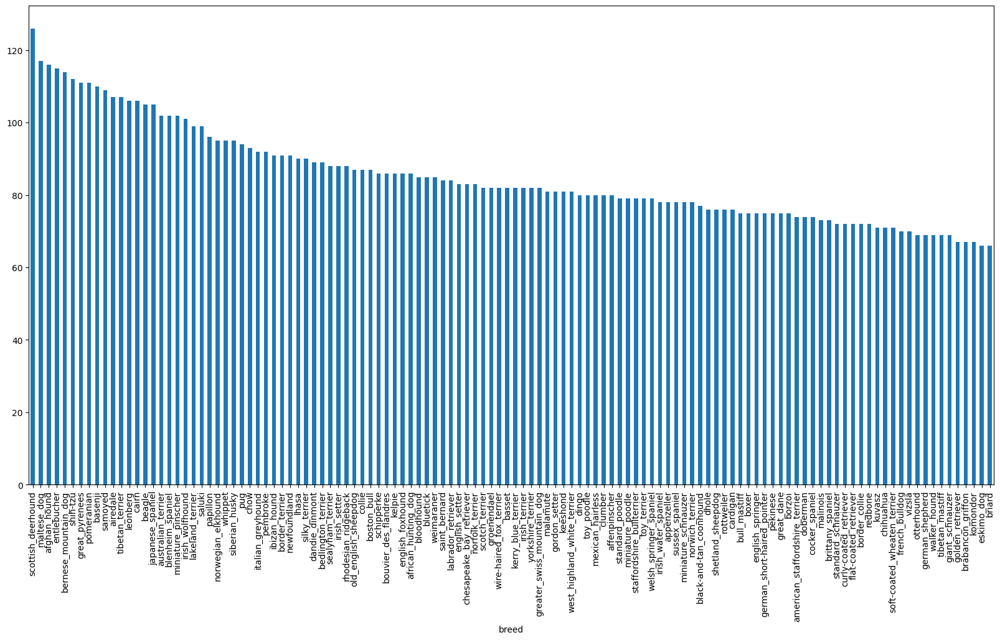

In [ ]:
# How many images are there per each breed?

labels_csv["breed"].value_counts().plot.bar(figsize= (20, 10))


In [ ]:
labels_csv["breed"].value_counts().median()

82.0

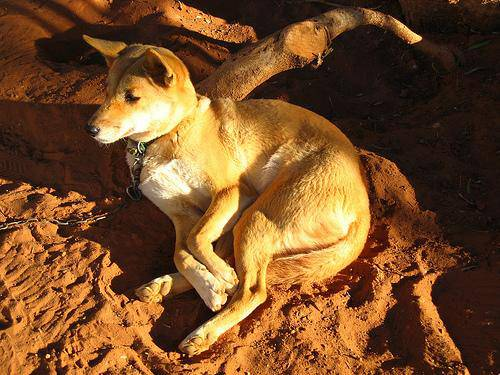

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/projects/dog breed classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and there labels

Let's get a list of all our image file path names.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filename = ["drive/MyDrive/projects/dog breed classification/train/" + fname + ".jpg" for fname in labels_csv["id"]]
# check the first 10
filename[:10]

['drive/MyDrive/projects/dog breed classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/projects/dog breed classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/projects/dog breed classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/projects/dog breed classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/projects/dog breed classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/projects/dog breed classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/projects/dog breed classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/projects/dog breed classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/projects/dog breed classification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/projects/dog breed classification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether numbers of filenames matches number of actual images files

import os
if len(os.listdir("drive/MyDrive/projects/dog breed classification/train")) == len(filename):
  print("File match")
else:
  print("File mismatch")

File match


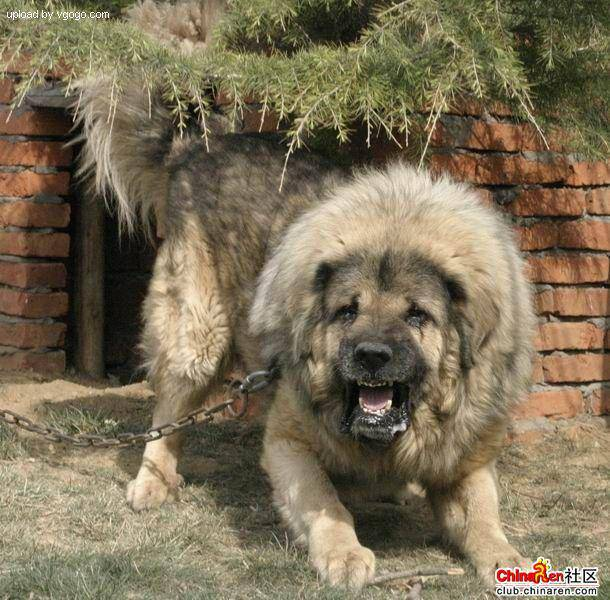

In [ ]:
# One more Check
Image(filename[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we're now got our training image filename in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see if numbers of labels matches the numbers of filename

if len(labels) == len(filename):
  print("File match")
else:
  print("File mismatch")

File match


In [ ]:
# Find the unique label values

unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#turn every label into boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# example Turning boolean aray into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index wher label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
Since the dataset from kaggle doesn't come with validation set so we have to create our own

In [ ]:
# Setup X & y
X = filename
y = boolean_labels

In [ ]:
len(filename)

10222

We're going to start our experimarntation with ~ 1000 images and increase as needed

In [ ]:
# Set numbers of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation

from sklearn.model_selection import train_test_split

# split them into traaining and validation of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
#Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/projects/dog breed classification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/projects/dog breed classification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/projects/dog breed classification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/projects/dog breed classification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/projects/dog breed classification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,

## Preprocessing Images (turning images into tensors)

To preprocess our image into tensors, we will write  a function which does a few things:
1. Take an iamge filepath as input
2. Use Tensorflow to read the file and save it to a variable, "image"
3. Turn our 'image' (a jpg) into tensors
4. Resize the 'image' to be a shape of (224, 224)
5. Return the modified image

how to load data in tensorflow:
https://www.tensorflow.org/guide/data

# Before we do, let's see what importing an image looks like.

In [ ]:
#convert an image into numpy array

from matplotlib.pyplot import imread
image = imread(filename[42])
image.shape
# below data show (height = 257, width = 350, color channel = 3 (red green blue pixels))

(257, 350, 3)

In [ ]:
# below means color channel red green blue values of the selected image is between 255 and 0
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

### Now we've seen what an image looks like as an tensor let's make a function to preprocess them,


## Preprocessing Images (turning images into tensors)

To preprocess our image into tensors, we will write  a function which does a few things:
1. Take an iamge filepath as input
2. Use Tensorflow to read the file and save it to a variable, "image"
3. Turn our 'image' (a jpg) into tensors
4. Normalize our m=image (convert color channel values from o-255 to 0-1)
5. Resize the 'image' to be a shape of (224, 224) #this means 224 high 224 wide
6. Return the modified image


In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path , img_size = IMG_SIZE):
  """
  Takes an image file and turns the image into tensors
  """

  # Read in the image
  image = tf.io.read_file(image_path)

  # turn jpg into numverical tensor wih 3 color channel red green blue
  image = tf.image.decode_jpeg(image, channels=3)

  # cinvert the color channel value from 0-255 to 0-1 values

  image = tf.image.convert_image_dtype(image, tf.float32)

  # resize the image to our desired values (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,00+ images in one go.. they might not fit into memory.

that means suppose your system have only 8 gb of ram so it has the limitation of processing certain amount of images let's say less than 10,000 so thats why we do 32 (batch size) images at a time (you can manually adjust the batch size if needed.)

In order to use tensorflow effectively, we need our data in the form of tuples which look like this:
'(image, label)'

In [ ]:
# Create a simple function to return a tuple  (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the above function


(process_image(X[42], tf.constant(y[42]))) # in this example your y label is not converted into tensor to convert it use tf.constant

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuples of tensors in the form: '(image, label)', ;et's make a function to turn all of our data ('X' and 'y') into batches

In [ ]:
# define a batch size, 32 is a good start
# tensorflow is default to 32 but you can change that

BATCH_SIZE = 32

# Create a function to turn data into batches

def create_data_batches(X, y=None, batch_siz=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  #If the data is test dataset, we probably don't have labels

  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # create a tensorflow dataset from the tensor slices X and because we are passing X into tf.constant its going to convert X into tensors
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))

    # shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))

    # Create image label tuple this also turns image path into preprocess iamge
    data = data.map(get_image_label)

    # Turn thr training into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch




In [ ]:
# Create training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches
Creating validation data batches


In [ ]:
# lets check out different attribute  of our data batches
train_data.element_spec, val_data.element_spec

# the below result specifies that None is the batch size (yes we set it to 32 but its flexible height = 224, wide= 224, color channel =3)
# the next line shows that its in the image label pair of tensors, labels have batch shape of None because batch size is flexible and 120 because there is total number of 120 dog breeds

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

our data is now in batches, however, these can be a litle hard to understand/comprehend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and there labels from data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1) # row =5, col=5, index=i+1

    # Dislplay an image
    plt.imshow(images[i])

    # add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off") # turn off axis

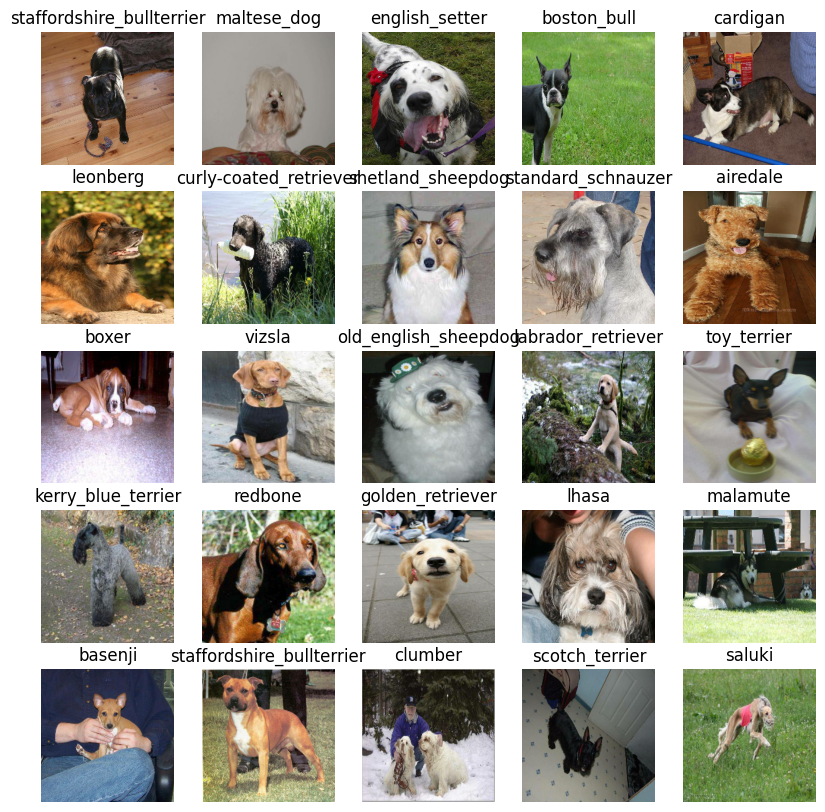

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())

show_25_images(train_images, train_labels)

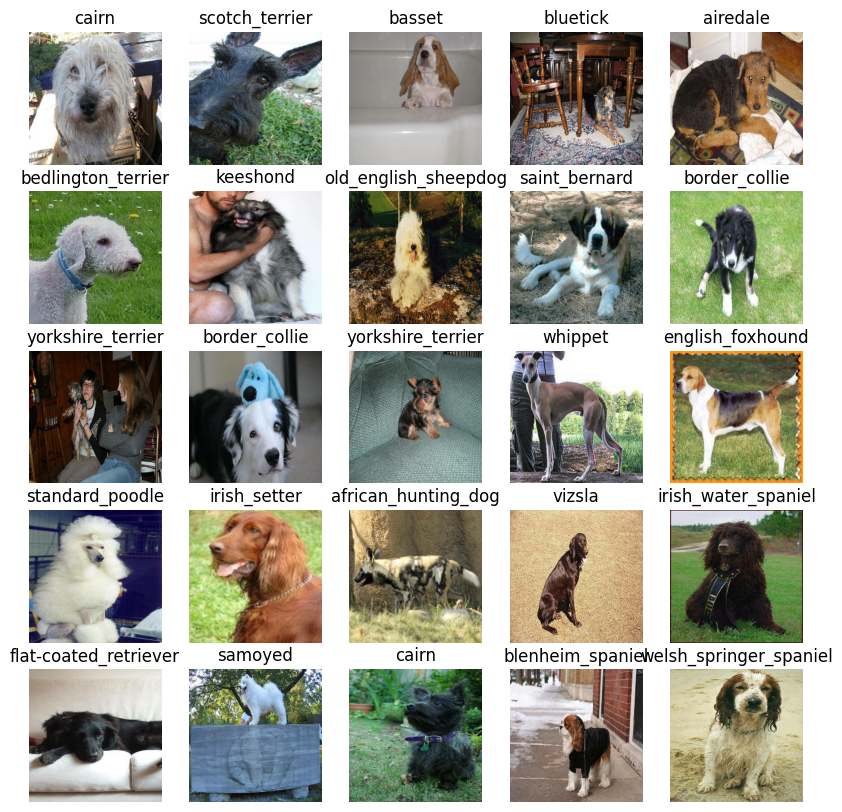

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())

show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of tensors ) to our model.
* The output shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use.
from tensorflow hub "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]# batch, height, width, color channel

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs and outputs and models ready to go.
Let's put together into a Keras deep learning model.

Knowing this, Let's create a function which:

* Takes the input layers in a Keras model in a sequential fashion (do this first, then this, then that).

* Compiles the model (says it should be evaluated and improved).

* Builds the model (telss the model the input shape it'll be getting).
* return model.

All of these steps can be found on

https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape= INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # layer 2 (output layer) while working with multiclass classification we use softmax for binary classification = Sigmoid
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # suppose you have to classify between cat and dog that means there is just two option then we will use binarycrossentropy but not in this case because its multiclass
      optimizer = tf.keras.optimizers.Adam(),
      metrics=["accuracy"] # there are many metrics accuracy is default one search tensorflow metrics for more
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

building model with:  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 10))
outputs

array([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

## Creating Callbacks

Callbacks are helper function a model can use during training to do such as save its progres, check its progress or stop training early if a model stops improving

we'll create two callbacks one for tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## Tensorboard callback

to setup a tensorboard callback we need to do 3 things:

1. Load the tensorboard extention
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our models fit() function.
3. Visualize  our model training logs with the %tensorboard magic function (we'll do this after model training)


In [ ]:
# Load Tensorboard notebook extention
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  # create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/MyDrive/projects/dog breed classification/logs",
                        # Make it so the logs tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

Early stopping helps our model to stop from overfitting if a certain evaluation metrics stops improving

In [ ]:
# create a early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## training a model (on subset of data)

our first model is only going to train on 1,000 images to make sure everything is working

Term Epochs you can define is that numbers of chances given to the model to revisit the training dataset to learn and then perform prediction on validation on valid dataset.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max: 100,steps:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("Gpu", tf.config.list_logical_devices("GPU"))

Gpu [LogicalDevice(name='/device:GPU:0', device_type='GPU')]


# Let's create a function which trains a model.

* Create a model using 'create_models()'
* Setup a tensorboard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we  will like to use
* Return model

In [ ]:
# build a function to train and return a trained model

def train_model():
  """
  train a given model and return the trained version
  """
  # crete a model
  model = create_model()

  # create new Tensorboard session everytime we trained a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x = train_data,
            epochs= NUM_EPOCHS,
            validation_data= val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  return model

In [ ]:
# fit our model to the data
model = train_model()


building model with:  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 263s 10s/step - loss: 4.7400 - accuracy: 0.0887 - val_loss: 3.5669 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 149ms/step - loss: 1.7321 - accuracy: 0.6600 - val_loss: 2.2477 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 143ms/step - loss: 0.5959 - accuracy: 0.9262 - val_loss: 1.7339 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 6s 223ms/step - loss: 0.2612 - accuracy: 0.9850 - val_loss: 1.5342 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 3s 139ms/step - loss: 0.1523 - accuracy: 0.9975 - val_loss: 1.4234 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 202ms/step - loss: 0.1022 - accuracy: 1.0000 - val_loss: 1.3760 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============

**Question:** it loks like our model is overfitting becase it's performaing better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural network?

**Note:** OVerfitting to begin with is a good thing it means our model is learning

### Checking the tensorboard logs

the tensorboard magic function %tensorboard will access the logs directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/projects/dog\ breed\ classification/logs

 # remember to put forward and backword slash properly otherwise it will not work

<IPython.core.display.Javascript object>

## Making and evaluating prediction using a trained model

In [ ]:
# Make prediction on validation data(not used to trained on)

prediction= model.predict(val_data, verbose=1)
prediction

7/7 [==============================] - 9s 107ms/step


array([[1.6200388e-03, 3.4899633e-05, 8.6946535e-04, ..., 1.6172809e-04,
        1.6190370e-05, 4.6962262e-03],
       [1.3549025e-03, 1.0296369e-03, 8.5085658e-03, ..., 3.7550260e-04,
        1.7072167e-03, 5.7012547e-04],
       [6.6885077e-06, 7.5182303e-05, 3.1609403e-04, ..., 3.0147883e-05,
        2.4003036e-04, 4.5463964e-04],
       ...,
       [1.9369685e-05, 5.3266918e-05, 7.0794958e-05, ..., 1.5740039e-05,
        3.3972642e-04, 9.4271883e-05],
       [3.1834962e-03, 2.0717546e-04, 2.7998112e-04, ..., 1.0704045e-04,
        4.9110320e-05, 6.6487747e-03],
       [4.1554519e-03, 4.6109458e-06, 1.6992475e-03, ..., 2.5501137e-03,
        1.6447924e-03, 1.9063165e-05]], dtype=float32)

In [ ]:
(prediction[0]).sum()

0.99999994

In [ ]:
prediction.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# first prediction
index = 1
print(prediction[index])
print(f"max value (probabilty of prediction): {np.max(prediction[index]) * 100:.2f}%")
print(f"sum : {np.sum(prediction[index])* 100:.2f}%")
print(f"max index: {np.argmax(prediction[index])}")
print(f"breed: {unique_breeds[np.argmax(prediction[index])]}")

[1.35490252e-03 1.02963694e-03 8.50856584e-03 1.99298072e-03
 8.88464216e-04 1.16374267e-05 1.78549364e-02 6.51559036e-04
 3.07175773e-03 8.20408110e-04 4.44018398e-04 8.88071518e-05
 3.17776605e-04 1.69471939e-04 3.58354038e-04 4.33938374e-04
 1.09577202e-03 8.51697405e-04 6.31605144e-05 2.63834372e-04
 1.74746616e-03 8.33733066e-05 1.93377549e-04 3.91988375e-04
 8.51339719e-04 2.77404586e-04 2.39164457e-02 1.06679264e-03
 8.81157903e-05 1.54748512e-03 2.61275360e-04 1.96194960e-04
 8.94187484e-04 7.69871258e-05 7.24220008e-04 4.35842434e-04
 2.86428956e-04 1.07556330e-02 1.00959383e-04 4.63970413e-04
 1.89223222e-03 6.81128586e-04 6.08021044e-04 6.64293359e-04
 7.74420286e-03 1.79556862e-03 1.19873369e-03 2.82914116e-04
 5.70061356e-02 3.02838853e-05 5.66450180e-04 3.32513533e-04
 1.19791650e-04 2.55179639e-05 2.39891047e-03 2.50438810e-03
 2.43267335e-04 6.00016601e-02 7.24201673e-05 1.36602279e-02
 4.22980258e-04 1.19309780e-05 6.43546664e-05 4.85479031e-05
 1.62642188e-02 7.269397

In [ ]:
unique_breeds[96]

'scotch_terrier'

Having the above fubnctionality is great but we want to be able to do it at scale.

and it would be even better if we could see the image prediction is being made on

**Note:** prediction probability are also as confidence levels.

In [ ]:
# Turn prediction probabilties into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based ona an array of prediction of probabilites
pred_label= get_pred_label(prediction[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset,
we'll have to unbatchify it to make prediction on the validation images and then compare the prediction to the validation labels (truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a function to unbatch a batch dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) pairs and returns separate arrays of images and labels
  """
  images_ = []
  labels_ = []
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

#unbatchify the validatiom data

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* prediction labels
* validation labels (truth labels)
* validation images

let's make some function to make these all a bit more visualize.

we'll create a function which:
* takes an array of prediction probabilties, an array of truth and an array of images and integers.
* convert the prediction probabilites to a prediction labels.
* plot the prediction labels, it's prediction probability, the truth label and target image on a single plot

In [ ]:
def plot_preds(prediction_probabilities, labels, images, n=1):
  """
  View images along with their prediction and truth label and sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the prediction label
  pred_label = get_pred_label(pred_prob)

  #plot images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob) * 100,
                                    true_label),
                                    color= color)

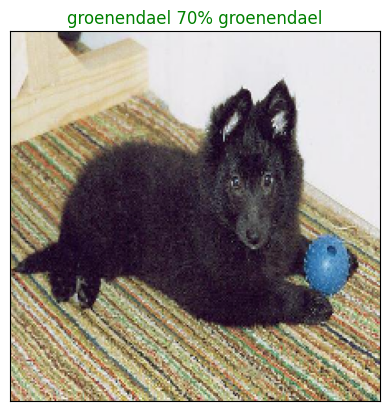

In [ ]:
plot_preds(prediction_probabilities = prediction,
          labels= val_labels,
          images = val_images,
           n=77)

Now we 've got one function to visualize our models predictions let's make another to view our model top 10 prediction

this function will:

* Take an input of prediction probabilites array and a gorund thruth array and integer

* find prediction using get_preds_label()
* find top 10:
* prediction probabilites index
* prediction probabilites values
* prediction labels
* plot the top 10 prediction probabilites values and labels, coloring the truth label green


In [ ]:
def plot_preds_conf(prediction_probabilities, labels, n=1):
  """
  Plus thet top 10 highest prediction confidence along labels for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the prediction label
  pred_label = get_pred_label(pred_prob)

  #find the top 10 prediction confidence index

  top_10_preds_indexes = pred_prob.argsort()[-10:][::-1]

  #find the top 10 prediction confidence values
  top_10_preds_values = pred_prob[top_10_preds_indexes]

  # find the top 10 prediction labels
  top_10_preds_labels = unique_breeds[top_10_preds_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_preds_labels)),
                     top_10_preds_values,
                     color='gray')
  plt.xticks(np.arange(len(top_10_preds_labels)),
             labels = top_10_preds_labels,
             rotation='vertical')

  # change the color of true label
  if np.isin(true_label, top_10_preds_labels):
    top_plot[np.argmax(top_10_preds_labels == true_label)].set_color('green')
  else:
    pass


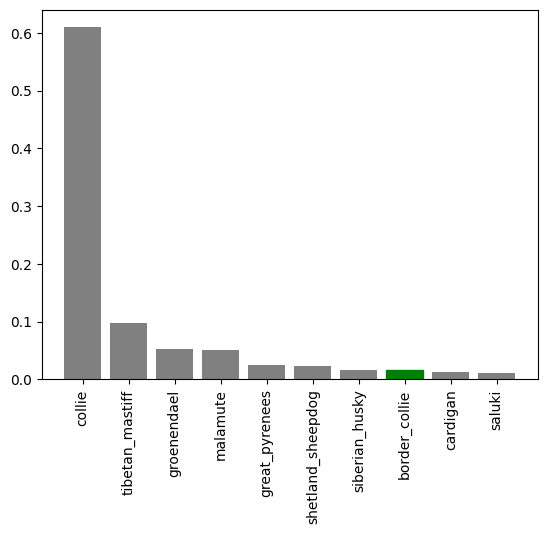

In [ ]:
plot_preds_conf(prediction_probabilities = prediction,
          labels= val_labels,
          n=9)

In [ ]:
prediction[0][prediction[0].argsort()[-10:][::-1]]

array([0.16802266, 0.12775135, 0.11089116, 0.10416947, 0.09654784,
       0.09218933, 0.04201188, 0.03548115, 0.02782095, 0.02263727],
      dtype=float32)

In [ ]:
prediction[0].max()

0.16802266

In [ ]:
unique_breeds[prediction[0].argsort()[-10:][::-1]]

array(['cairn', 'soft-coated_wheaten_terrier', 'silky_terrier',
       'komondor', 'lhasa', 'irish_wolfhound', 'standard_schnauzer',
       'border_terrier', 'tibetan_terrier', 'dandie_dinmont'],
      dtype=object)

Now we've got some function to help us visualize our prediction and evaluate our model, let's check out few.

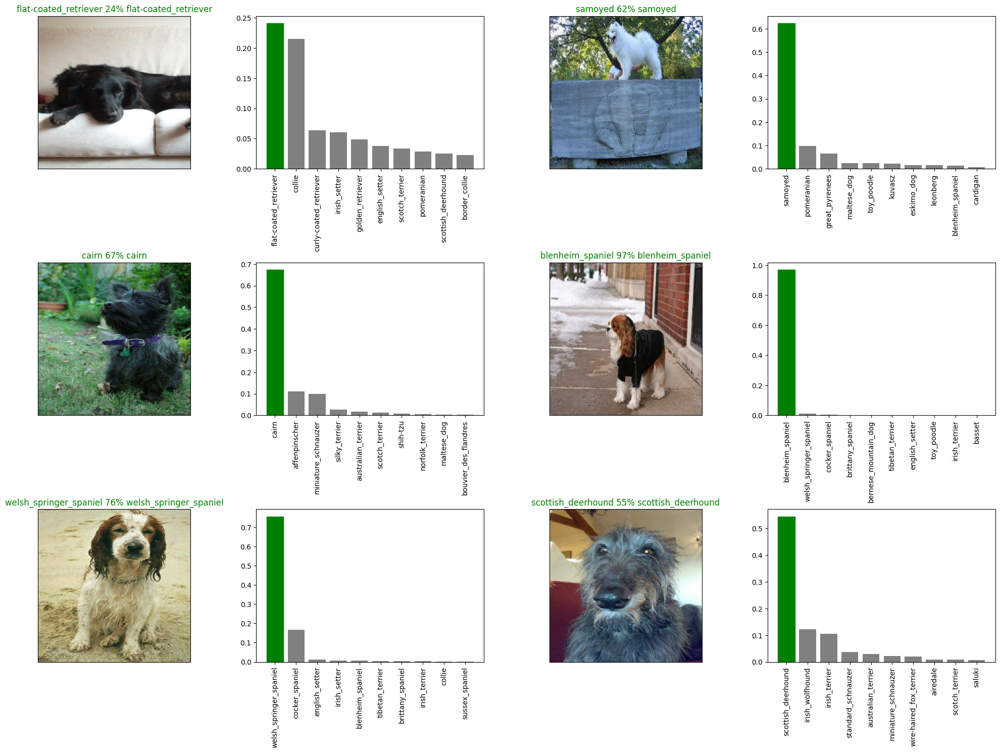

In [ ]:
#Let's check out a few prediction and their different values

i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10 * num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i+1)
  plot_preds(prediction_probabilities = prediction,
          labels = val_labels,
          images = val_images,
           n=i+i_multiplier)

  plt.subplot(num_rows, 2 * num_cols, 2 * i+2)
  plot_preds_conf(prediction_probabilities = prediction,
          labels = val_labels,
          n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models prediction and true labels?

In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(cm, class_names):
    plt.figure(figsize=(10, 8))

    # Reduce the number of labels to 10
    if len(class_names) > 10:
        class_names_reduced = class_names[:10]
        cm_reduced = cm[:10, :10]
    else:
        class_names_reduced = class_names
        cm_reduced = cm

    sns.heatmap(cm_reduced, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names_reduced, yticklabels=class_names_reduced,
                annot_kws={"size": 10})
    plt.xlabel('Predicted Labels', fontsize=12)
    plt.ylabel('True Labels', fontsize=12)
    plt.title('Confusion Matrix', fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()

7/7 [==============================] - 1s 168ms/step


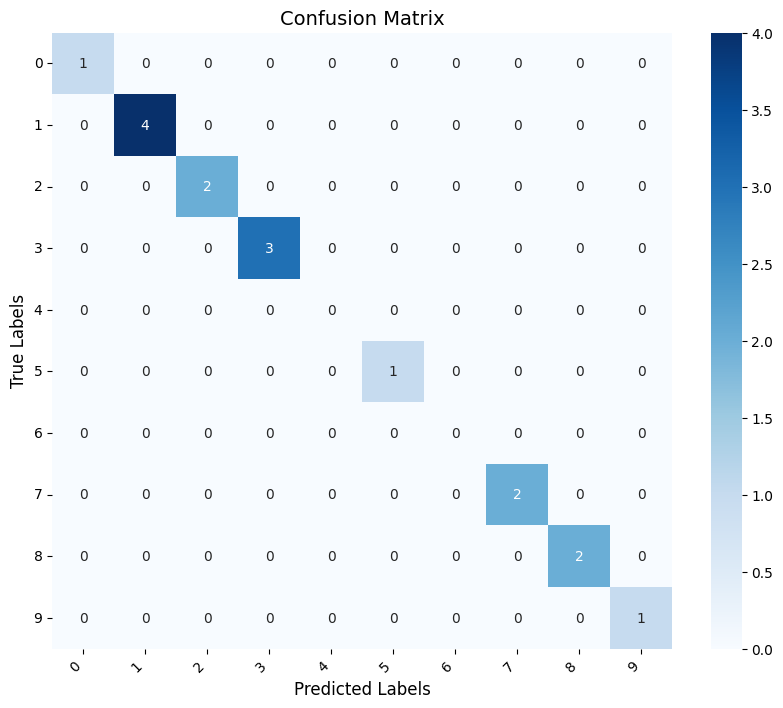

In [ ]:
# How would you create a confusion matrix with our models prediction and true labels?
predict = model.predict(val_data)
predict_classes = np.argmax(predict, axis=1) # Get predicted class indices
true_label = np.array([np.argmax(label) for label in y_val]) # Convert y_val to class indices

conf_matrix_tf = tf.math.confusion_matrix(true_label, predict_classes) # Calculate confusion matrix
conf_matrix = conf_matrix_tf.numpy()
class_names = [str(i) for i in range(len(np.unique(true_label)))] # Get class names
plot_confusion_matrix(conf_matrix, class_names)

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model

def save_model(model, suffix=None):
  """
  saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory with current time
  modeldir = os.path.join("drive/MyDrive/projects/dog breed classification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#build a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

Now we've got a function to save and load a trained model, let's make sure they work!

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-adam")

Saving model to: drive/MyDrive/projects/dog breed classification/models/20240720-065958-1000-images-mobilenetv2-adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/projects/dog breed classification/models/20240720-065958-1000-images-mobilenetv2-adam.h5'

In [ ]:
loaded_1000_image = load_model('drive/MyDrive/projects/dog breed classification/models/20240717-124559-1000-images-mobilenetv2-adam.h5')

Loading saved model from: drive/MyDrive/projects/dog breed classification/models/20240717-124559-1000-images-mobilenetv2-adam.h5


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 108ms/step - loss: 1.3026 - accuracy: 0.6500


[1.3026020526885986, 0.6499999761581421]

In [ ]:
loaded_1000_image.evaluate(val_data)

7/7 [==============================] - 1s 98ms/step - loss: 1.3101 - accuracy: 0.6500


[1.3100786209106445, 0.6499999761581421]

# training a big dog model on the full data

In [ ]:
len (X) , len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/projects/dog breed classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/projects/dog breed classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/projects/dog breed classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/projects/dog breed classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/projects/dog breed classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/projects/dog breed classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/projects/dog breed classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/projects/dog breed classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/projects/dog breed classification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/projects/dog breed classification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train), len(X_val)

(800, 200)

In [ ]:
len(y_train), len(y_val)

(800, 200)

In [ ]:
# create a data batch with full dataset

full_data = create_data_batches(X, y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model
full_model = create_model()

building model with:  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# create a full model callbacks

full_model_tensoroard = create_tensorboard_callback()

#No validation set when training on all data, so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell below will take alittle while maybe more than 30 min for 1st epoch because runtime has to load all the images into memory

In [ ]:
# fit the full model to the full data

#full_model.fit(x = full_data,
 #              epochs = NUM_EPOCHS,
  #             callbacks = [full_model_tensoroard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-data-100-epochs-mobilenetv2-adam")

Saving model to: drive/MyDrive/projects/dog breed classification/models/20240720-070009-full-data-100-epochs-mobilenetv2-adam.h5...


'drive/MyDrive/projects/dog breed classification/models/20240720-070009-full-data-100-epochs-mobilenetv2-adam.h5'

In [ ]:
loaded_full_model = load_model('drive/MyDrive/projects/dog breed classification/models/20240717-133506-full-data-100-epochs-mobilenetv2-adam.h5')

Loading saved model from: drive/MyDrive/projects/dog breed classification/models/20240717-133506-full-data-100-epochs-mobilenetv2-adam.h5


## Make predictions on the test dataset

Since our model, has been trained on images in the form of Tensor batches, to make prediction on the test data, we'll have to get int into same format.

Luckily we created create_data_batches() earlier which can take a list of filename as input and convert them into Tensor batches.

To make prediction on the test data, we'll:
* Get the test images filename
*Convert the filename into test data batches using
create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels)
* Make a prediction array by passing the test batches to the predict() method on our model.

In [ ]:
# load test images filename
test_path = 'drive/MyDrive/projects/dog breed classification/test/'
test_filename = [test_path + fname for fname in os.listdir(test_path)]
test_filename[:10]

['drive/MyDrive/projects/dog breed classification/test/e9cee3bd9000422ec5e391c932da60f8.jpg',
 'drive/MyDrive/projects/dog breed classification/test/ed3c3d91c25ad370e44704caa4bc1c63.jpg',
 'drive/MyDrive/projects/dog breed classification/test/ee7bdce4ac4008b3551ca66f82712e31.jpg',
 'drive/MyDrive/projects/dog breed classification/test/ede33cc93aa6dd4f7bc7fb2436026d08.jpg',
 'drive/MyDrive/projects/dog breed classification/test/f0311d1414f9ce10cffda4c207c108dc.jpg',
 'drive/MyDrive/projects/dog breed classification/test/ef7462aaef0907fbe406e23a4462f086.jpg',
 'drive/MyDrive/projects/dog breed classification/test/ec25ce11616bda2e8b7669c415128768.jpg',
 'drive/MyDrive/projects/dog breed classification/test/ef4501591ee2433e06ff5312df879593.jpg',
 'drive/MyDrive/projects/dog breed classification/test/f596d629c90c70820c38a094f03be387.jpg',
 'drive/MyDrive/projects/dog breed classification/test/f169ebcd375a7b6ecd252f27e3dba0a2.jpg']

In [ ]:
len(test_filename)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filename, test_data=True)

Creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

Note: calling predict() on our full model and passing it the test data batch will take a long to run (about an hour).

In [ ]:
# Make prediction on test data batch using the loaded full model

test_prediction = loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 321s 952ms/step


In [ ]:
# Save prediction (Numpy aray0) to csv file (for access later)
np.savetxt("drive/MyDrive/projects/dog breed classification/preds_array.csv" , test_prediction, delimiter=',')

In [ ]:
# laod prediction (Numpy array) from csv file
test_prediction = np.loadtxt('drive/MyDrive/projects/dog breed classification/preds_array.csv', delimiter=',')

In [ ]:
test_prediction[:10]

array([[3.04065573e-08, 6.52791569e-13, 3.93604900e-08, ...,
        3.46263962e-10, 4.28500879e-09, 8.21945719e-07],
       [6.66054267e-10, 1.59543490e-11, 2.72313474e-11, ...,
        9.89369141e-07, 4.93675536e-08, 1.25440351e-07],
       [8.58538613e-07, 2.44713888e-10, 1.95609520e-08, ...,
        2.99380325e-08, 3.11019685e-04, 2.73974507e-07],
       ...,
       [2.07928161e-10, 5.15943625e-12, 8.22266755e-10, ...,
        6.66872893e-07, 1.41569458e-08, 2.77453754e-10],
       [1.51610990e-09, 3.01209474e-11, 1.15218857e-09, ...,
        2.72631326e-07, 2.66303687e-05, 3.48235024e-10],
       [3.80149146e-07, 1.28845850e-08, 6.97151803e-09, ...,
        7.30367378e-10, 5.66184553e-07, 8.61991954e-04]])

In [ ]:
test_prediction.shape

(10357, 120)

## Preparing test dataset prediction for kaggle
Looking at the Kaggle sample submission, we find that it wants our model prediction probability output in a dataframe with an ID and a column for each dog breed.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format:

* Create a pandas datafrane with an id coloumn as well as column for each dog breed

* Add data to the ID coloumn by extracting the test image ID's from their filepaths
* Add data (the prediction probabilites) to each of the dog breed coloumns
* Export the dataframe as csv to submit it to Kaggle.

In [ ]:
# create a dataframewith empty coloumn

preds_df = pd.DataFrame(columns= ['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_id = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df["id"] = test_id

In [ ]:
os.path.splitext(test_filename[0])

('drive/MyDrive/projects/dog breed classification/test/e9cee3bd9000422ec5e391c932da60f8',
 '.jpg')

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e9cee3bd9000422ec5e391c932da60f8, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"(ed3c3d91c25ad370e44704caa4bc1c63, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"(ee7bdce4ac4008b3551ca66f82712e31, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"(ede33cc93aa6dd4f7bc7fb2436026d08, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"(f0311d1414f9ce10cffda4c207c108dc, .jpg)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)] = test_prediction
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,"(e9cee3bd9000422ec5e391c932da60f8, .jpg)",3.040656e-08,6.527916e-13,3.936049e-08,1.063193e-12,2.595637e-08,2.650610e-12,6.828582e-08,1.394835e-08,1.521474e-06,...,3.916880e-10,2.525522e-09,7.134336e-12,1.362229e-10,4.193200e-10,6.149496e-10,4.918169e-03,3.462640e-10,4.285009e-09,8.219457e-07
1,"(ed3c3d91c25ad370e44704caa4bc1c63, .jpg)",6.660543e-10,1.595435e-11,2.723135e-11,4.577589e-10,5.014781e-02,1.104727e-07,1.490846e-07,4.201396e-05,4.351991e-10,...,2.564190e-08,2.444533e-08,5.194459e-08,1.990236e-08,1.093977e-10,4.714305e-09,3.589867e-10,9.893691e-07,4.936755e-08,1.254404e-07
2,"(ee7bdce4ac4008b3551ca66f82712e31, .jpg)",8.585386e-07,2.447139e-10,1.956095e-08,7.289626e-12,9.771265e-08,4.311660e-12,5.004445e-09,1.499750e-08,2.743922e-08,...,1.933560e-09,5.769147e-07,1.715062e-09,2.299049e-07,1.423686e-11,1.585556e-09,9.993733e-01,2.993803e-08,3.110197e-04,2.739745e-07
3,"(ede33cc93aa6dd4f7bc7fb2436026d08, .jpg)",2.186952e-11,9.748407e-10,1.212430e-12,4.462452e-08,9.480273e-09,1.607582e-05,1.252697e-09,2.564467e-12,2.210016e-10,...,2.236086e-12,1.045014e-09,2.753045e-09,5.574106e-07,4.528707e-08,3.042552e-09,5.657089e-12,5.285363e-08,7.437206e-13,4.466873e-11
4,"(f0311d1414f9ce10cffda4c207c108dc, .jpg)",1.076534e-10,3.941024e-08,2.228402e-11,1.402249e-08,1.227389e-04,3.857583e-10,6.019145e-10,7.174948e-09,2.852406e-10,...,1.704246e-11,1.347318e-12,2.015647e-03,3.850463e-04,1.453754e-05,5.528793e-09,1.204536e-14,1.845539e-03,1.367806e-07,1.515428e-04


In [ ]:
# export it to csv
preds_df.to_csv("drive/MyDrive/projects/dog breed classification/full_model_preds_1_mobile_netV2.csv", index=False)

# Making prediction on custom iamges

To make pewdiction on custom images, we'll:

* Get the filepaths of our own images.

* Turn the filepaths into data batches using  create_data_batches(). And since our images won't have labels, we set the test_data parameter to True.

* Pass the custom images data batch to our models' predict() method.

* Convert the prediction output probabilites to prediction labels.

* Convert the prediction labels to the custom images

In [ ]:
# Get custom images filepath

custom_path = "drive/MyDrive/projects/dog breed classification/My-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_path

['drive/MyDrive/projects/dog breed classification/My-dog-photos/labra-1.jpeg',
 'drive/MyDrive/projects/dog breed classification/My-dog-photos/american_staffordshire_terrier-2.jpeg',
 'drive/MyDrive/projects/dog breed classification/My-dog-photos/labra-2.jpeg',
 'drive/MyDrive/projects/dog breed classification/My-dog-photos/american_staffordshire_terrier-1.jpeg',
 'drive/MyDrive/projects/dog breed classification/My-dog-photos/dandie_dinmont-1.jpeg',
 'drive/MyDrive/projects/dog breed classification/My-dog-photos/dandie_dinmont-2.jpeg']

In [ ]:
# Turn custom_iamges into batch dataset

custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make prediction on the custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 4s 4s/step


array([[3.18995243e-12, 1.23770438e-10, 8.66757430e-11, 9.67507810e-11,
        1.32503644e-07, 4.74413508e-10, 2.80774622e-11, 5.78854742e-11,
        1.69495251e-09, 6.44064130e-07, 2.24059896e-10, 9.89735129e-16,
        7.90682453e-09, 1.58523997e-12, 2.98724157e-10, 6.53680554e-10,
        2.10763074e-11, 1.32273900e-10, 8.39609826e-10, 8.81924048e-12,
        4.43724918e-12, 5.82578256e-12, 1.10788028e-11, 2.60307442e-10,
        4.14495466e-10, 1.17567957e-07, 5.53419498e-11, 7.17968462e-11,
        1.80975102e-09, 1.31015572e-08, 6.54528341e-12, 4.66687730e-11,
        3.88023835e-08, 4.59103977e-10, 1.22482746e-07, 8.87610263e-10,
        2.30852316e-11, 1.12101550e-09, 7.34839967e-12, 4.84194729e-08,
        4.25371297e-07, 2.43715892e-09, 1.24885623e-11, 6.74218656e-13,
        4.40202371e-07, 2.23044361e-09, 4.21693409e-12, 1.54663784e-08,
        1.17041151e-11, 4.18932363e-03, 4.79892481e-09, 1.04374067e-06,
        1.63845781e-09, 1.68268871e-10, 8.82532234e-14, 2.707249

In [ ]:
custom_preds.shape

(6, 120)

In [ ]:
# get custom image prediction labels
custom_preds_labels= [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['labrador_retriever',
 'american_staffordshire_terrier',
 'labrador_retriever',
 'american_staffordshire_terrier',
 'dandie_dinmont',
 'dandie_dinmont']

In [ ]:
# Get custom images (our unbatchyfy function wont work since there arent labels maybe we could fix this later)
custom_images = []

#loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

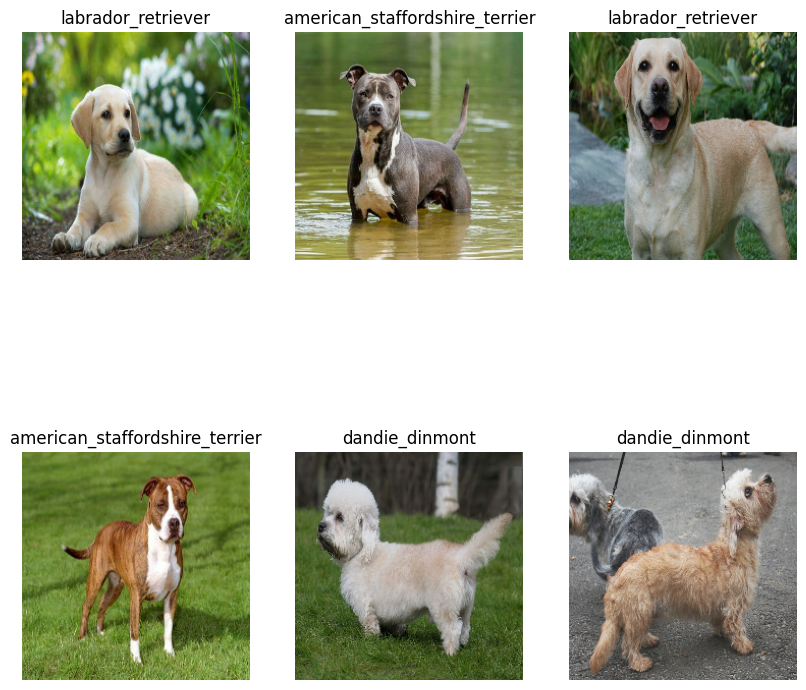

In [ ]:
# check custom images prediction
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 3, i+1)  # 2 rows, 3 columns
  plt.xticks([])
  plt.yticks([])
  plt.imshow(image)
  plt.title(custom_preds_labels[i])
  plt.axis("off")